<a href="https://colab.research.google.com/github/Haadi-kp/Image_Colourization/blob/main/Colab_Notebooks/Copy_of_Unet_architecture_23_01_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install torchviz

In [ ]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb
from torchviz import make_dot
from torchsummary import summary
import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
use_colab = None

In [ ]:
!pip install fastai==2.4

INFO: pip is looking at multiple versions of fastai to determine which version is compatible with other requirements. This could take a while.
ERROR: Could not find a version that satisfies the requirement torch<1.10,>=1.7.0 (from fastai) (from versions: 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1, 2.1.2, 2.2.0, 2.2.1, 2.2.2, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.5.0, 2.5.1)
ERROR: No matching distribution found for torch<1.10,>=1.7.0


In [ ]:
from fastai.data.external import untar_data, URLs
coco_path = untar_data(URLs.COCO_SAMPLE)
coco_path = str(coco_path) + "/train_sample"
use_colab = True

In [ ]:
if use_colab == True:
    path = coco_path
else:
    path = "Your path to the dataset"

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names
np.random.seed(123)
paths_subset = np.random.choice(paths, 10_000, replace=False) # choosing 1000 images randomly
rand_idxs = np.random.permutation(10_000)
train_idxs = rand_idxs[:8000] # choosing the first 8000 as training set
val_idxs = rand_idxs[8000:] # choosing last 2000 as validation set
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]
print(len(train_paths), len(val_paths))

8000 2000


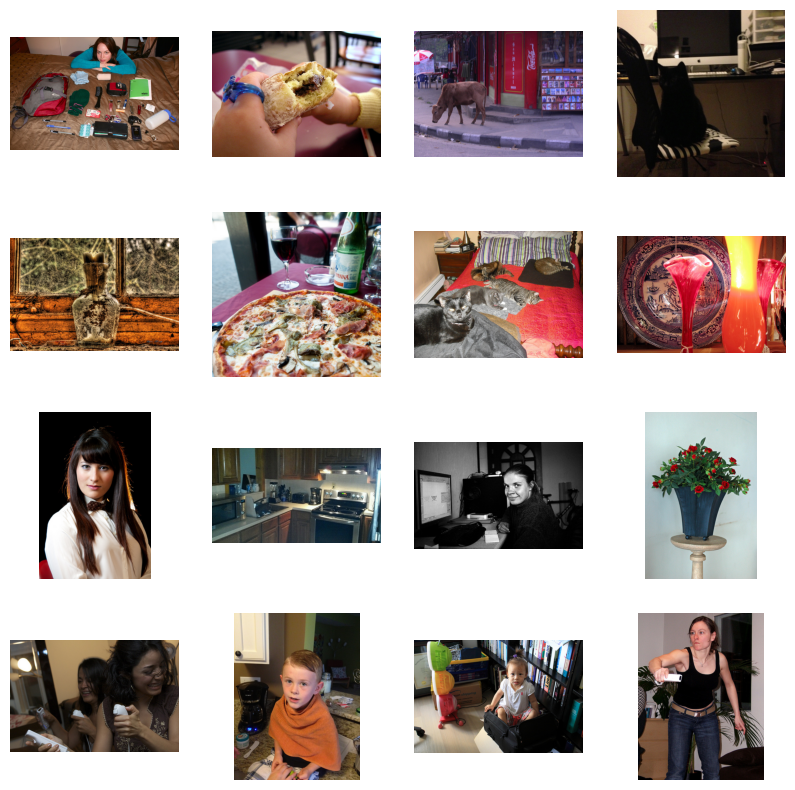

In [ ]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

In [ ]:
SIZE = 256
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.BICUBIC)

        self.split = split
        self.size = SIZE
        self.paths = paths

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

        return {'L': L, 'ab': ab}

    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

In [ ]:
train_dl = make_dataloaders(paths=train_paths, split='train')
val_dl = make_dataloaders(paths=val_paths, split='val')

data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
500 125


In [ ]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)

        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

    def forward(self, x):
        return self.model(x)

In [ ]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2)
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)

    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [ ]:
PatchDiscriminator(3)

PatchDiscriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (

In [ ]:
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size
out = discriminator(dummy_input)
out.shape

torch.Size([16, 1, 30, 30])

In [ ]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()

    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [ ]:
def init_weights(net, init='norm', gain=0.02):

    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

In [ ]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4,
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1

        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad

    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)

    def forward(self):
        self.fake_color = self.net_G(self.L)

    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()

    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()

    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()

        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

In [ ]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def calculate_psnr(img1, img2):
    """
    Calculate PSNR between two images.
    Args:
        img1: Ground truth image (RGB, range [0, 1]).
        img2: Predicted image (RGB, range [0, 1]).
    Returns:
        PSNR value.
    """
    psnr_value = peak_signal_noise_ratio(img1, img2, data_range=1.0)
    return psnr_value

def calculate_ssim(img1, img2):
    """
    Calculate SSIM between two images.
    Args:
        img1: Ground truth image (RGB, range [0, 1]).
        img2: Predicted image (RGB, range [0, 1]).
    Returns:
        SSIM value.
    """
    # Explicitly set win_size and handle multichannel
    ssim_value = structural_similarity(
        img1, img2, win_size=7, channel_axis=-1, data_range=1.0
    )
    return ssim_value


In [ ]:
class AverageMeter:
    def __init__(self):
        self.reset()

    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()

    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """

    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

def visualize_with_metrics(model, data, save=True):
    """
    Visualize the outputs and calculate PSNR and SSIM metrics.
    Args:
        model: Trained model.
        data: A batch of data (L and ab channels).
        save: Whether to save the visualization figure.
    """
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()

    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)

    # Calculate PSNR and SSIM for each image in the batch
    psnr_values = []
    ssim_values = []
    for i in range(len(fake_imgs)):
        psnr = calculate_psnr(real_imgs[i], fake_imgs[i])
        ssim = calculate_ssim(real_imgs[i], fake_imgs[i])
        psnr_values.append(psnr)
        ssim_values.append(ssim)

    # Log average PSNR and SSIM for the batch
    avg_psnr = np.mean(psnr_values)
    avg_ssim = np.mean(ssim_values)
    print(f"Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}")

    # Plot the visualizations
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()

    if save:
        fig.savefig(f"colorization_with_metrics_{time.time()}.png")


def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

In [ ]:


# Move model to the appropriate device
model = MainModel().to(device)

# Print the model summary
print("Generator Summary:")
summary(model.net_G, input_size=(1, 256, 256))  # Input: Grayscale image (1 channel)

print("\nDiscriminator Summary:")
summary(model.net_D, input_size=(3, 256, 256))  # Input: L and ab combined (3 channels)


model initialized with norm initialization
model initialized with norm initialization
Generator Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,024
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,072
       BatchNorm2d-4          [-1, 128, 64, 64]             256
         LeakyReLU-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,288
       BatchNorm2d-7          [-1, 256, 32, 32]             512
         LeakyReLU-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 16, 16]       2,097,152
      BatchNorm2d-10          [-1, 512, 16, 16]           1,024
        LeakyReLU-11          [-1, 512, 16, 16]               0
           Conv2d-12            [-1, 512, 8, 8]       4,194,30

In [ ]:


# # Generate a sample input for visualization
# sample_input = torch.randn(1, 1, 256, 256).to(device)  # Single grayscale image

# # Pass the input through the Generator
# output = model.net_G(sample_input)

# # Visualize the computational graph
# graph = make_dot(output, params=dict(model.net_G.named_parameters()))
# graph.render("generator_architecture", format="png")  # Save as PNG



In [ ]:
# Get a real input batch from the DataLoader
data = next(iter(train_dl))  # Load one batch from the training DataLoader
real_input = data['L'].to(device)  # Grayscale input (L-channel)

# Pass the real input through the Generator
output = model.net_G(real_input)

# Visualize the computational graph
from torchviz import make_dot
graph = make_dot(output, params=dict(model.net_G.named_parameters()))

# Save the graph as a PNG file
graph.render("new_generator_architecture", format="png")

print("Generator architecture saved as 'new_generator_architecture.png'")


Generator architecture saved as 'new_generator_architecture.png'


In [ ]:
def train_model_with_metrics(model, train_dl, val_dl, epochs, display_every=250, visualize_every=5):
    """
    Train the model and log PSNR and SSIM metrics during training.
    Args:
        model: MainModel instance.
        train_dl: Training dataloader.
        val_dl: Validation dataloader.
        epochs: Number of epochs to train.
        display_every: Interval to display visualizations and metrics.
        visualize_every: Interval to display images and print current epoch.
    """
    data = next(iter(val_dl))  # A batch for visualization
    for e in range(epochs):
        loss_meter_dict = create_loss_meters()
        i = 0
        for data in tqdm(train_dl):
            model.setup_input(data)
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0))
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}\n")
                log_results(loss_meter_dict)

            # Display images at the specified interval (every 5 epochs)
            if (e + 1) % visualize_every == 0:
                print(f"\nDisplaying results for Epoch {e+1}/{epochs}\n")
                visualize_with_metrics(model, data, save=False)

# Train the model with metrics
model = MainModel()
train_model_with_metrics(model, train_dl, val_dl, epochs=30)


In [ ]:
# Define the path to save the model
save_path = "/content/drive/MyDrive/saved_model/"

# Ensure the directory exists
os.makedirs(save_path, exist_ok=True)

# Save the model
model_file_path = os.path.join(save_path, "2:Unet_colorization_model.pth")
torch.save(model, model_file_path)


print(f"Model saved at {model_file_path}")

Model saved at /content/drive/MyDrive/saved_model/2:Unet_colorization_model.pth


Processing image from: https://images.pexels.com/photos/346529/pexels-photo-346529.jpeg?cs=srgb&dl=pexels-bri-schneiter-28802-346529.jpg&fm=jpg


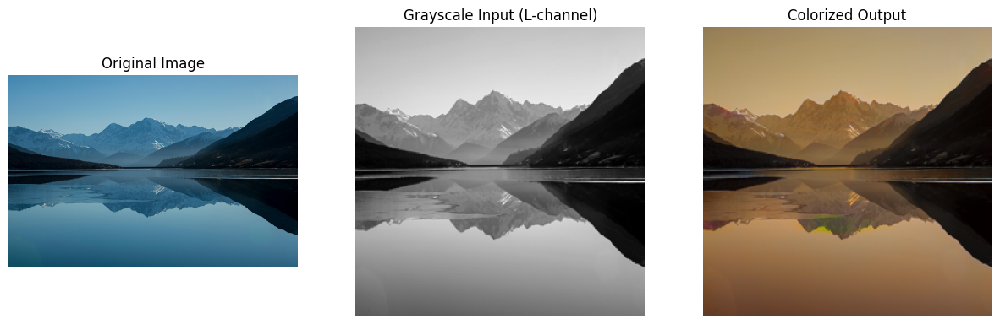

Processing image from: https://media.istockphoto.com/id/517188688/photo/mountain-landscape.jpg?s=612x612&w=0&k=20&c=A63koPKaCyIwQWOTFBRWXj_PwCrR4cEoOw2S9Q7yVl8=


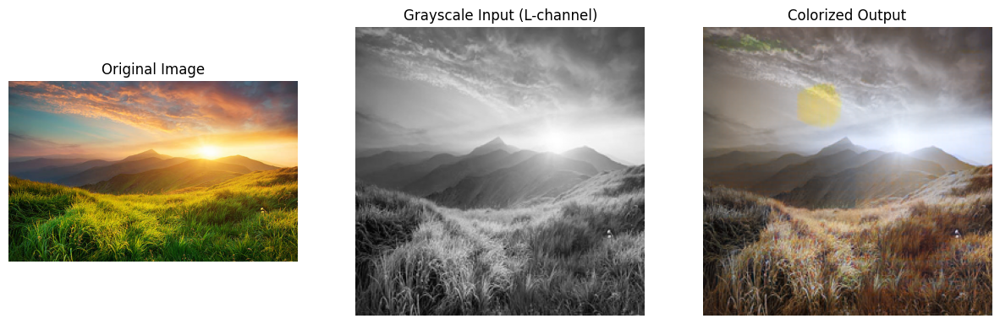

In [ ]:
import requests
from PIL import Image
from io import BytesIO

def download_image(url):
    """
    Download an image from a URL and return it as a PIL Image.
    """
    response = requests.get(url)
    if response.status_code == 200:
        img = Image.open(BytesIO(response.content)).convert("RGB")
        return img
    else:
        print(f"Failed to download image from {url}")
        return None

def preprocess_image(img, size=256):
    """
    Preprocess the image for the model:
    - Resize to the required size.
    - Convert to L*a*b* and extract the L-channel.
    """
    img = img.resize((size, size), Image.BICUBIC)
    img_array = np.array(img)
    img_lab = rgb2lab(img_array).astype("float32")  # Convert to L*a*b
    L = img_lab[:, :, 0]  # Extract L channel
    L = (L / 50.0) - 1.0  # Normalize L to [-1, 1]
    L_tensor = torch.tensor(L).unsqueeze(0).unsqueeze(0)  # Add batch and channel dimensions
    return L_tensor.to(device)

def postprocess_and_display(L, ab, original_img):
    """
    Post-process the model's output:
    - Combine L and predicted ab channels.
    - Convert to RGB.
    - Display original grayscale and colorized images side by side.
    """
    L = L.cpu()
    ab = ab.cpu()
    fake_rgb = lab_to_rgb(L, ab)[0]  # Convert first image in batch to RGB
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    # Display Original Image
    ax[0].imshow(original_img)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    # Display Grayscale (Input)
    ax[1].imshow(L[0, 0], cmap="gray")
    ax[1].set_title("Grayscale Input (L-channel)")
    ax[1].axis("off")

    # Display Colorized (Output)
    ax[2].imshow(fake_rgb)
    ax[2].set_title("Colorized Output")
    ax[2].axis("off")

    plt.show()

def test_model_with_images(model, image_urls, size=256):
    """
    Test the trained model with a list of image URLs.
    Args:
        model: Trained PyTorch model.
        image_urls: List of image URLs.
        size: Size to which images will be resized.
    """
    model.net_G.eval()  # Set the model to evaluation mode
    for url in image_urls:
        print(f"Processing image from: {url}")
        img = download_image(url)  # Download the image
        if img is None:
            continue
        L_tensor = preprocess_image(img, size)  # Preprocess the image
        with torch.no_grad():
            fake_ab = model.net_G(L_tensor)  # Predict ab channels
        postprocess_and_display(L_tensor, fake_ab, img)  # Display results

# List of image URLs
image_urls = [
    "https://images.pexels.com/photos/346529/pexels-photo-346529.jpeg?cs=srgb&dl=pexels-bri-schneiter-28802-346529.jpg&fm=jpg",
    "https://media.istockphoto.com/id/517188688/photo/mountain-landscape.jpg?s=612x612&w=0&k=20&c=A63koPKaCyIwQWOTFBRWXj_PwCrR4cEoOw2S9Q7yVl8=",

]

# Test the model
test_model_with_images(model, image_urls)


In [ ]:
def test_model_with_metrics(model, val_dl, num_samples=5):
    """
    Test the model on the test set, visualize results, and calculate PSNR/SSIM.
    Args:
        model: Trained PyTorch model.
        val_dl: DataLoader for the validation/test set.
        num_samples: Number of samples to evaluate and visualize.
    """
    model.net_G.eval()

    psnr_values = []
    ssim_values = []
    samples_shown = 0

    for data in val_dl:
        if samples_shown >= num_samples:
            break

        # Extract inputs and ground truth
        L = data['L'].to(device)
        ab_real = data['ab'].to(device)

        with torch.no_grad():
            # Predict ab channels
            ab_fake = model.net_G(L)

        # Convert to RGB
        L_cpu = L.cpu()
        ab_real_cpu = ab_real.cpu()
        ab_fake_cpu = ab_fake.cpu()

        real_images = lab_to_rgb(L_cpu, ab_real_cpu)  # Ground truth
        fake_images = lab_to_rgb(L_cpu, ab_fake_cpu)  # Predicted

        # Calculate PSNR and SSIM
        for i in range(len(real_images)):
            psnr = calculate_psnr(real_images[i], fake_images[i])
            ssim = calculate_ssim(real_images[i], fake_images[i])
            psnr_values.append(psnr)
            ssim_values.append(ssim)

            if samples_shown < num_samples:
                # Visualize results
                fig, ax = plt.subplots(1, 3, figsize=(15, 5))

                ax[0].imshow(L[i][0].cpu(), cmap="gray")
                ax[0].set_title("Grayscale Input (L-channel)")
                ax[0].axis("off")

                ax[1].imshow(fake_images[i])
                ax[1].set_title("Colorized Output")
                ax[1].axis("off")

                ax[2].imshow(real_images[i])
                ax[2].set_title("Ground Truth")
                ax[2].axis("off")

                plt.show()

                samples_shown += 1

    # Log average metrics
    avg_psnr = np.mean(psnr_values)
    avg_ssim = np.mean(ssim_values)
    print(f"Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}")


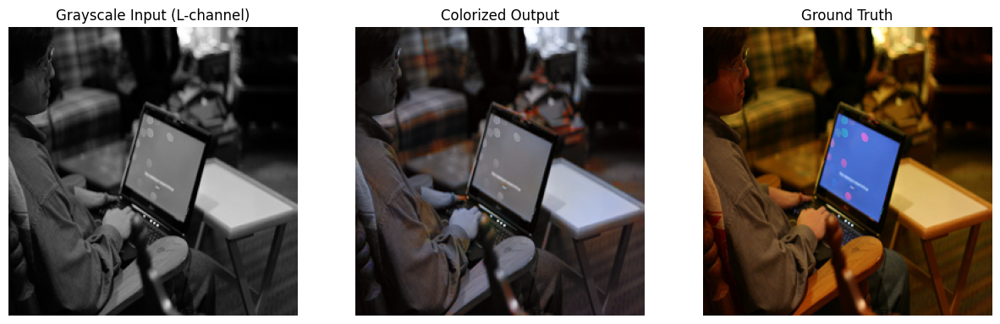

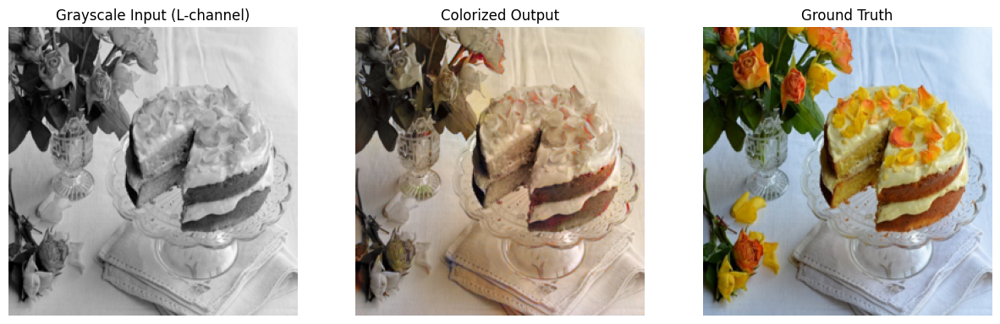

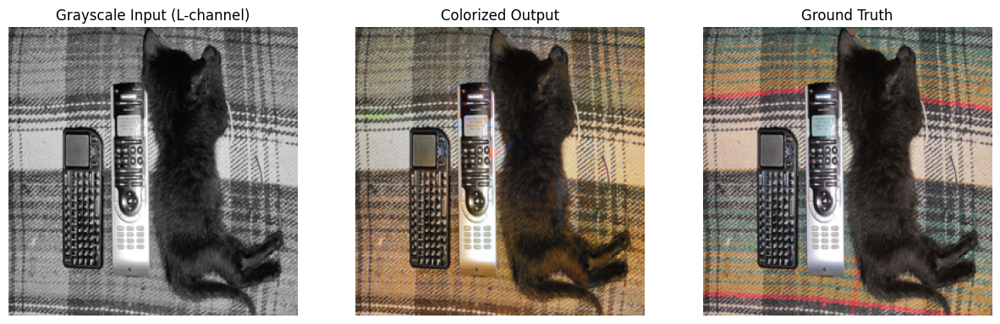

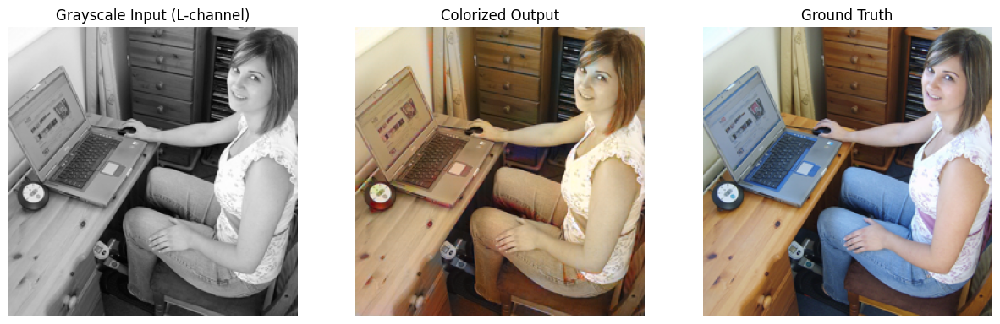

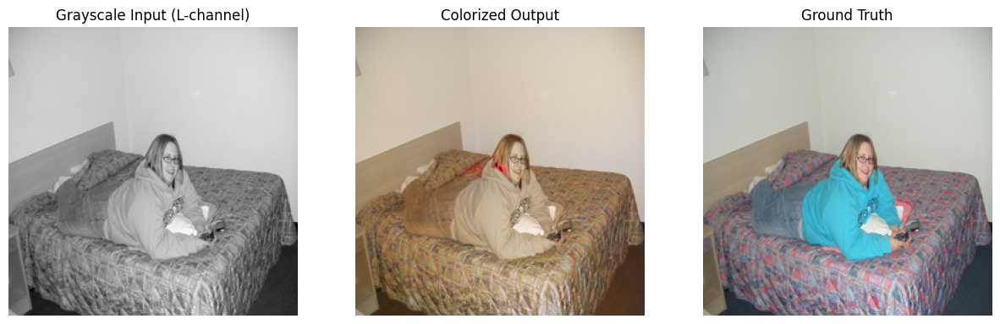

...

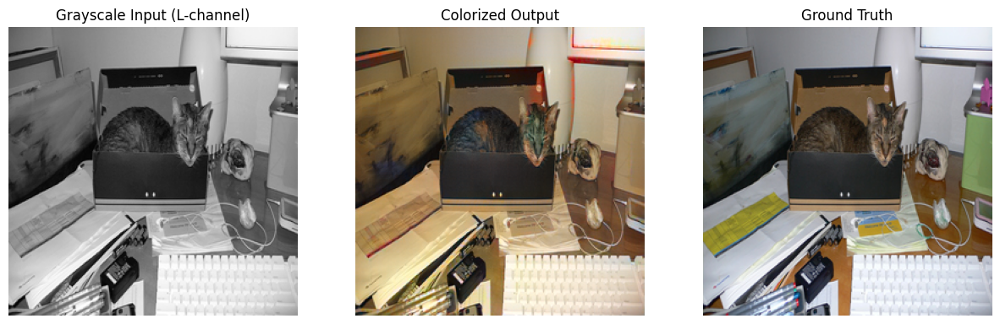

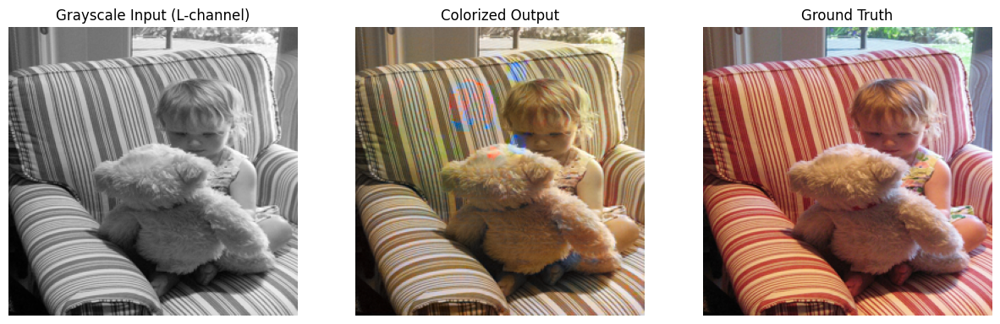

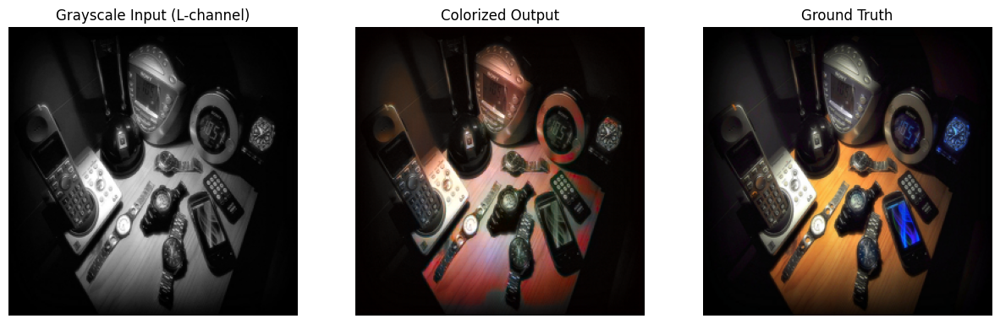

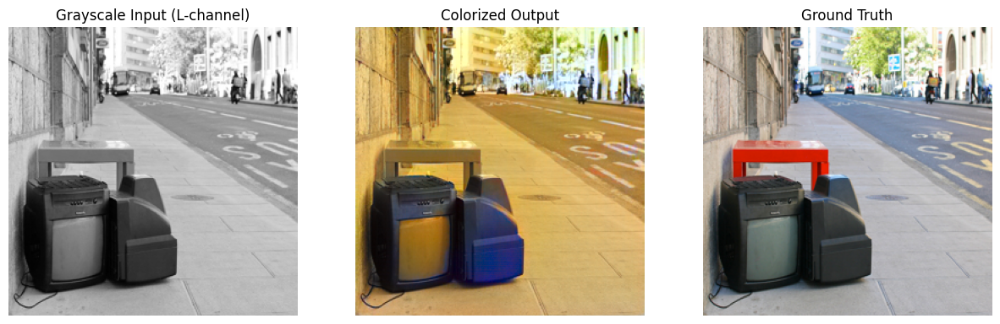

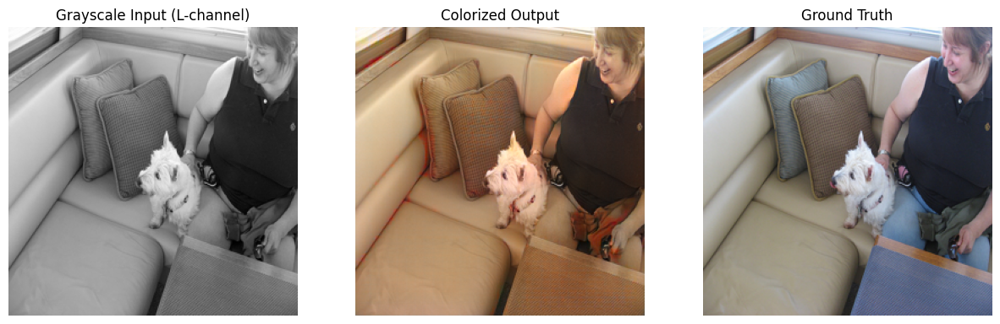

Avg PSNR: 19.7752, Avg SSIM: 0.8583


In [ ]:
# Test the trained model on the validation/test set
test_model_with_metrics(model, val_dl, num_samples=15)


In [ ]:
from google.colab import files

In [ ]:
import os
import torch
from torchvision import transforms
from PIL import Image
from skimage.color import rgb2lab, lab2rgb
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

# Set image size
SIZE = 256

# Function to load the saved model
def load_trained_model(model_path, device):
    """
    Load the saved PyTorch model.
    Args:
        model_path: Path to the saved model file.
        device: Device to load the model onto (CPU or GPU).
    Returns:
        Loaded model.
    """
    model = torch.load(model_path, map_location=device)
    model.eval()  # Set the model to evaluation mode
    return model

# Function to preprocess the grayscale image
def preprocess_image(image_path, size=SIZE):
    """
    Preprocess a grayscale image for the model.
    Args:
        image_path: Path to the grayscale image.
        size: Target size for the image (default: 256x256).
    Returns:
        Preprocessed L-channel tensor and the resized original grayscale image.
    """
    # Load the image and convert to RGB (if needed)
    img = Image.open(image_path).convert("RGB")

    # Apply transforms similar to `ColorizationDataset`
    transforms_pipeline = transforms.Compose([
        transforms.Resize((size, size), Image.BICUBIC)  # Resize to model's input size
    ])
    img_resized = transforms_pipeline(img)

    # Convert to LAB color space
    img_array = np.array(img_resized)
    img_lab = rgb2lab(img_array).astype("float32")  # Convert to LAB

    # Extract and normalize the L-channel
    L = img_lab[:, :, 0] / 50.0 - 1.0  # Normalize to [-1, 1]
    L_tensor = torch.tensor(L).unsqueeze(0).unsqueeze(0)  # Add batch and channel dimensions

    return L_tensor, img_resized

# Function to colorize the grayscale image
def colorize_image(model, L_tensor, device):
    """
    Colorize a grayscale image using the trained model.
    Args:
        model: Trained GAN model.
        L_tensor: Preprocessed L-channel tensor.
        device: Device to run the model on.
    Returns:
        Colorized image in RGB format.
    """
    # Move the input tensor to the appropriate device
    L_tensor = L_tensor.to(device)

    # Generate predicted `ab` channels using the model
    with torch.no_grad():
        ab_pred = model.net_G(L_tensor)  # Forward pass through the Generator

    # Denormalize L and predicted `ab` channels
    L = (L_tensor.squeeze().cpu().numpy() + 1.0) * 50.0  # Denormalize L-channel
    ab = ab_pred.squeeze().cpu().numpy() * 110.0  # Denormalize ab-channels

    ab = np.moveaxis(ab, 0, -1)  # Convert shape from (2, 256, 256) to (256, 256, 2)

    # Combine L and ab channels to form the LAB image
    lab_combined = np.zeros((L.shape[0], L.shape[1], 3))
    lab_combined[:, :, 0] = L
    lab_combined[:, :, 1:] = ab

    # Convert LAB image to RGB format
    rgb_image = lab2rgb(lab_combined)
    return rgb_image

# Function to upload and colorize an image
def upload_and_colorize_image(model, device):
    """
    Allow the user to upload a grayscale image, preprocess it, and colorize it using the trained model.
    Args:
        model: Trained GAN model.
        device: Device to run the model on.
    """
    # Upload an image using Google Colab's file upload widget
    uploaded = files.upload()
    for filename in uploaded.keys():
        print(f"Processing uploaded image: {filename}")

        # Preprocess the uploaded image
        L_tensor, original_image = preprocess_image(filename)

        # Colorize the image
        colorized_image = colorize_image(model, L_tensor, device)

        # Display the original grayscale and colorized images
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        ax[0].imshow(original_image, cmap="gray")
        ax[0].set_title("Original Grayscale Image")
        ax[0].axis("off")
        ax[1].imshow(colorized_image)
        ax[1].set_title("Colorized Image")
        ax[1].axis("off")
        plt.show()

# Main Program
if __name__ == "__main__":
    # Set the device (GPU or CPU)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Path to the saved model
    model_path = "/content/drive/MyDrive/saved_model/2:Unet_colorization_model.pth"

    # Load the trained model
    model = load_trained_model(model_path, device)
    print("Model loaded successfully!")

    # Upload and colorize the image
    upload_and_colorize_image(model, device)


Using device: cuda


<ipython-input-37-133b78dc33ae>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=device)


Model loaded successfully!
